## Sim Demo

### Imports

In [24]:
%load_ext autoreload
%autoreload 2

relative_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn
absolute_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
from env.imports import *

In [26]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

#### Check job specs

In [27]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 19.3%
RAM Usage: 12.0%
Available RAM: 886.1G
Total RAM: 1007.0G
52.4G


In [28]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.02 GB


In [29]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |


In [30]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

#### Simulation tests <a id="sims"></a>

In [33]:
from netneurotools import freesurfer as nnsurf
from netneurotools import stats as nnstats

In [34]:
lh_annot, rh_annot = netneurotools.datasets.fetch_schaefer2018('fsaverage', data_dir='data/UKBB', verbose=1)['400Parcels7Networks']

In [35]:
# this will find the center-of-mass of each parcel in the provided annotations
coords, hemi = netneurotools.freesurfer.find_parcel_centroids(lhannot=lh_annot, rhannot=rh_annot, surf='sphere')

In [36]:
spins, cost = nnstats.gen_spinsamples(coords, hemi, n_rotate=10, seed=42, return_cost=True)

In [37]:
spins[0].shape

(10,)

In [38]:
print(cost)

[[ 9.05230378  8.52267163  6.64935595 ... 10.31042233 13.47055015
   9.33917489]
 [11.66791278 10.91727158 14.24658945 ...  7.05281539 12.27479767
  13.89683093]
 [ 6.11408986 13.87881066 24.08608845 ...  7.31154461  9.71071114
  15.88698175]
 ...
 [ 3.97604797 15.15419167 14.70905764 ...  7.94823031 13.83770441
   2.35043808]
 [12.45763192 15.46039739 10.56710214 ... 10.95380325  2.61360226
  11.24086871]
 [14.66818964  6.62707371 10.12551838 ...  4.92610081 13.33012319
  12.85201567]]


In [39]:
from data.data_load import load_transcriptome, load_connectome

X = load_transcriptome(parcellation='S400', hemisphere='both', omit_subcortical=True, sort_genes='expression', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S400', hemisphere='both', omit_subcortical=True)

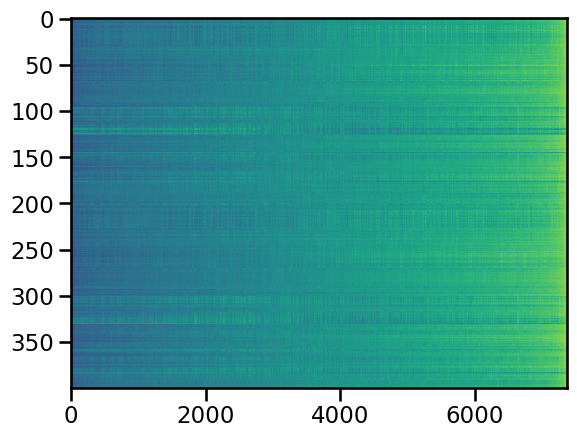

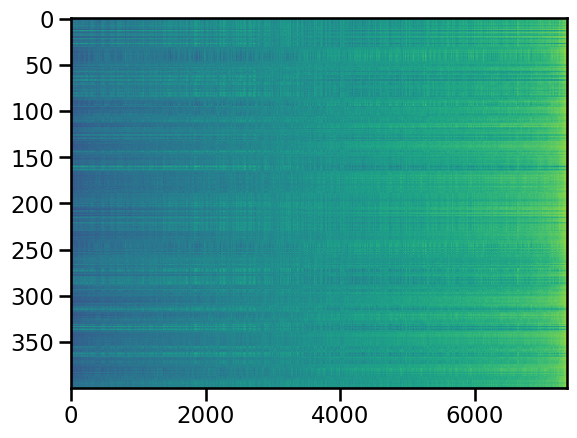

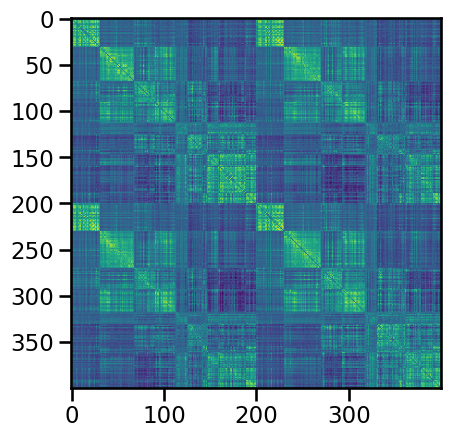

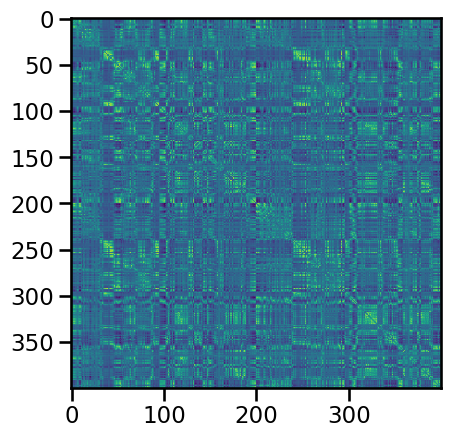

In [40]:
plt.imshow(X, aspect='auto')

# Get a random spin reordering - spins is shape (400,10) so we need to use it as an index array
random_spin_idx = 0 #  random.choice(range(10))
random_spin = spins[:, random_spin_idx]

# Plot X with the spin reordering
plt.figure()
plt.imshow(X[random_spin], aspect='auto')

# Plot Y with the spin reordering applied to both rows and columns
plt.figure()
plt.imshow(Y)

plt.figure()
plt.imshow(Y[random_spin][:, random_spin])


Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (400, 7380)
X_pca shape: (400, 27)
Y_sc shape: (400, 400)
Y_sc_spectralL shape: (400, 399)
Y_sc_spectralA shape: (400, 400)
Y_fc shape: (400, 400)
Coordinates shape: (400, 3)
Y shape (400, 400)
feature_name:  transcriptome_PCA
processing_type:  None
features ['transcriptome_PCA']
X generated... expanding to pairwise dataset


  return LooseVersion(v) >= LooseVersion(check)

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin


2
3
4
BEST CONFIG {'input_dim': 54, 'binarize': False, 'hidden_dims': [256, 128], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}


  warnings.warn(



Number of learnable parameters in MLP: 47873
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.00 GB
Best val loss so far at epoch 1: 0.0449
Best val loss so far at epoch 2: 0.0372
Best val loss so far at epoch 3: 0.0337
Best val loss so far at epoch 4: 0.0321
Best val loss so far at epoch 5: 0.0313
Epoch 5/100, Train Loss: 0.0545, Val Loss: 0.0313, Time: 1.02s
Best val loss so far at epoch 6: 0.0304
Best val loss so far at epoch 7: 0.0299
Best val loss so far at epoch 8: 0.0292
Best val loss so far at epoch 9: 0.0289
Best val loss so far at epoch 10: 0.0284
Epoch 10/100, Train Loss: 0.0326, Val Loss: 0.0284, Time: 1.00s
Best val loss so far at epoch 11: 0.0277
Best val loss so far at epoch 12: 0.0272
Best val loss so far at epoch 13: 0.0266
Best val loss so far at epoch 14: 0.0261
Best val loss so far at epoch 15: 0.0257
Epoch 15/100, Train Loss: 0.0272, Val Loss: 0.0257, Time: 1.01s
Best val loss so far at epoch 16: 0.0251
Best val loss so far at epoch 17: 0.0246
B

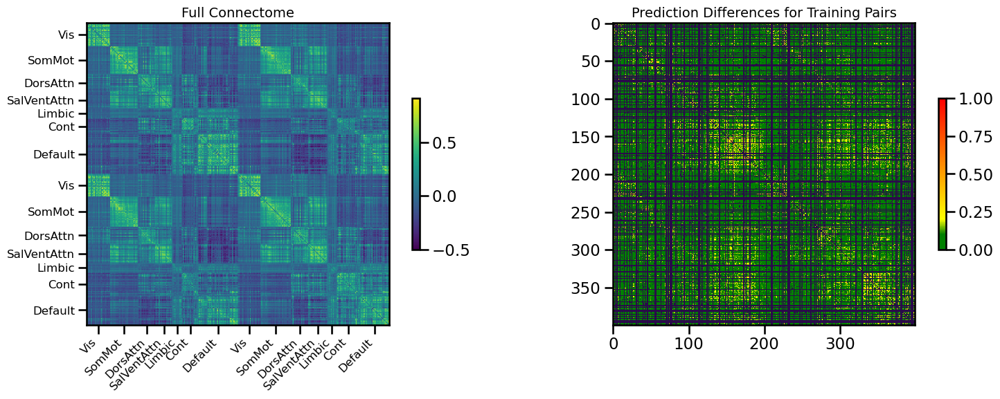

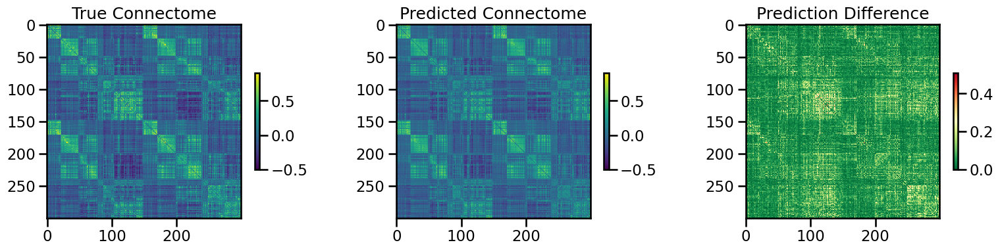

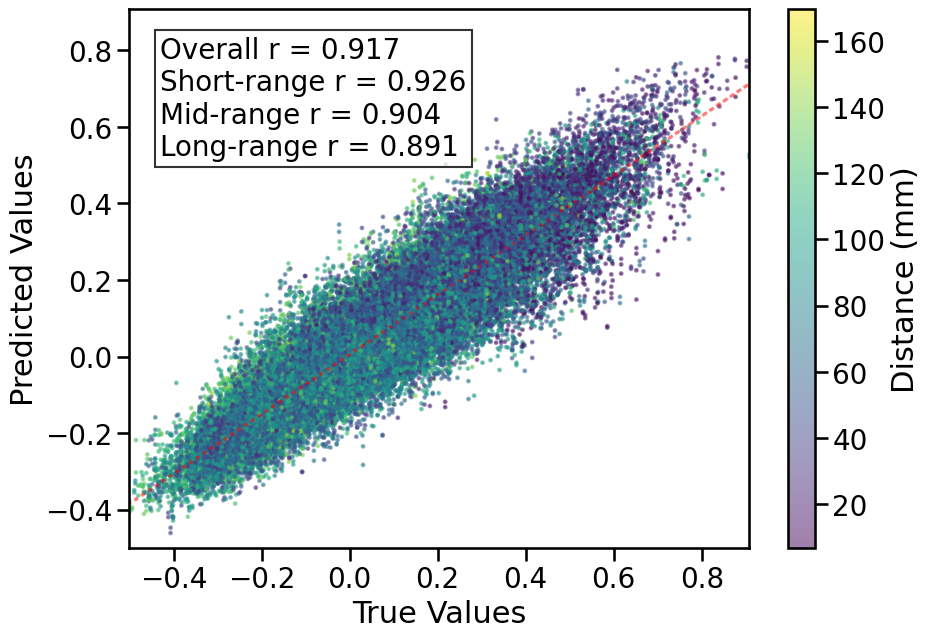

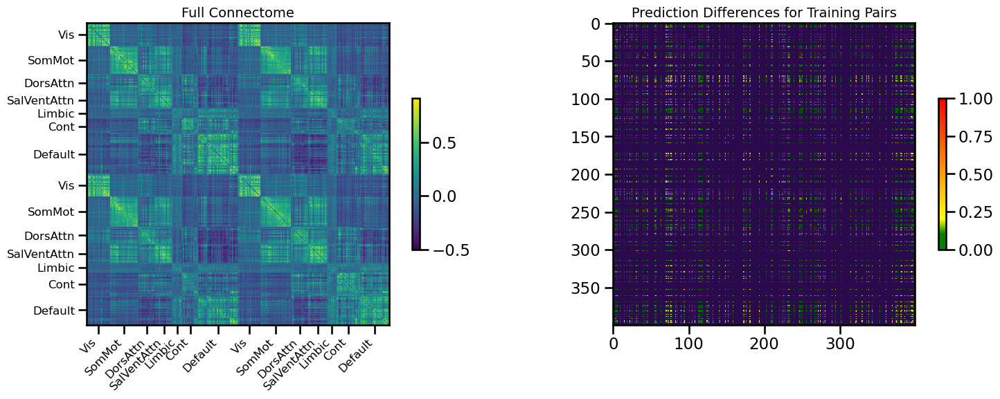

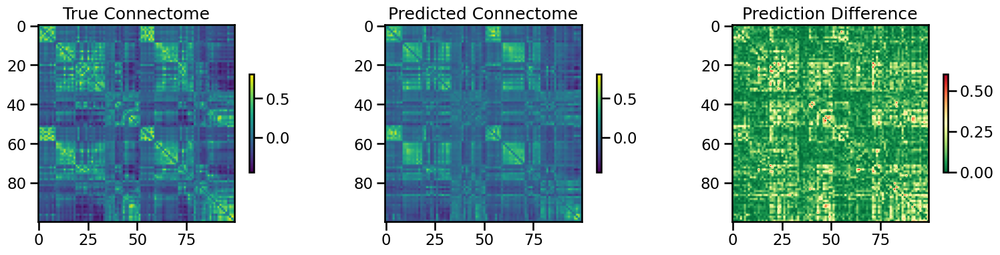

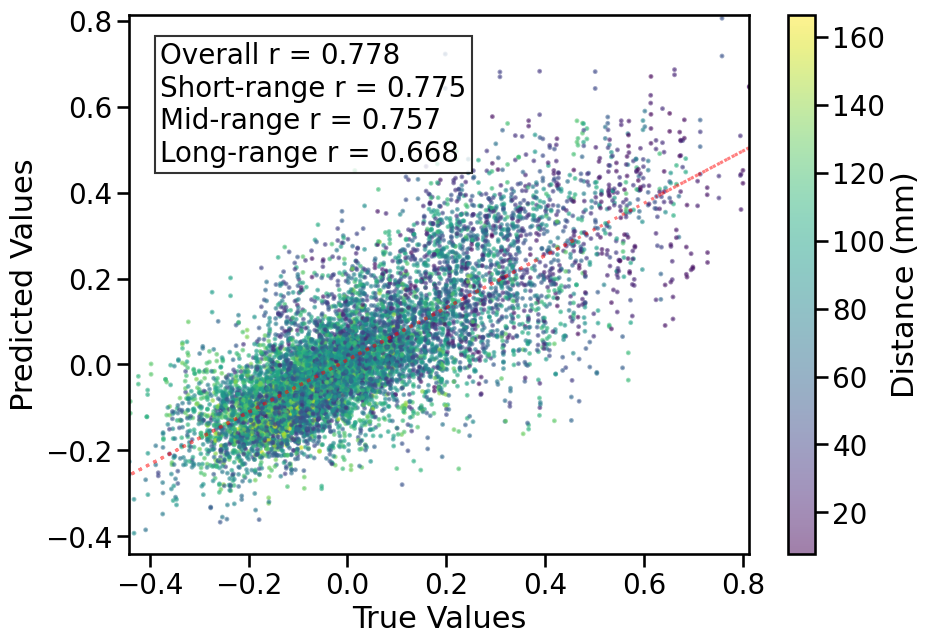


TRAIN METRICS: {'mse': 0.006616786, 'mae': 0.060806055, 'r2': 0.8367600658748784, 'pearson_corr': 0.9172580178376668, 'geodesic_distance': 17.300806299885483}
TEST METRICS: {'mse': 0.015752936, 'mae': 0.09264169, 'r2': 0.6052895442084132, 'pearson_corr': 0.7780493414435541, 'geodesic_distance': 11.717885777023426}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 54, 'binarize': False, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'batch_size': 512, 'epochs': 100}


  warnings.warn(



1
3
4
BEST CONFIG {'input_dim': 54, 'binarize': False, 'hidden_dims': [256, 128], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}
Number of learnable parameters in MLP: 47873
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.02 GB
Best val loss so far at epoch 1: 0.0544
Best val loss so far at epoch 2: 0.0432
Best val loss so far at epoch 3: 0.0391
Best val loss so far at epoch 4: 0.0368
Best val loss so far at epoch 5: 0.0355
Epoch 5/100, Train Loss: 0.0516, Val Loss: 0.0355, Time: 1.31s
Best val loss so far at epoch 6: 0.0347
Best val loss so far at epoch 7: 0.0339
Best val loss so far at epoch 8: 0.0334
Best val loss so far at epoch 9: 0.0327
Best val loss so far at epoch 10: 0.0321
Epoch 10/100, Train Loss: 0.0293, Val Loss: 0.0321, Time: 1.01s
Best val loss so far at epoch 11: 0.0314
Best val loss so far at epoch 12: 0.0309
Best val loss so far at epoch 13: 0.0302
Best val loss so far at epoch 14: 0.0297
Bes

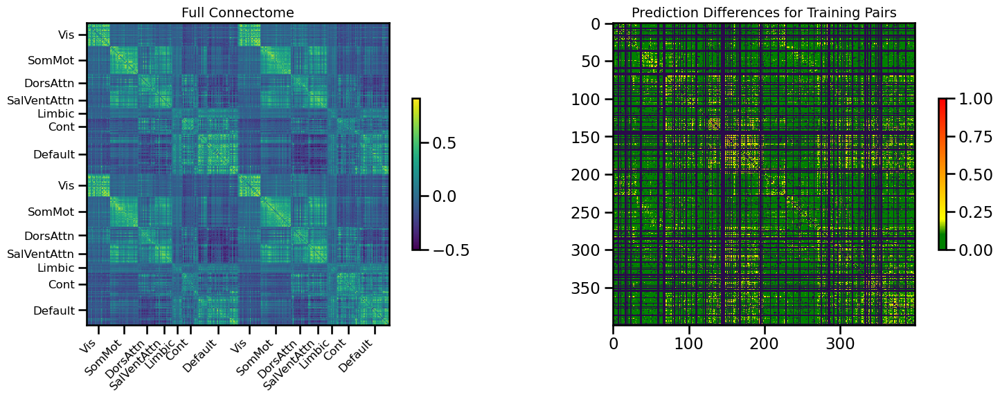

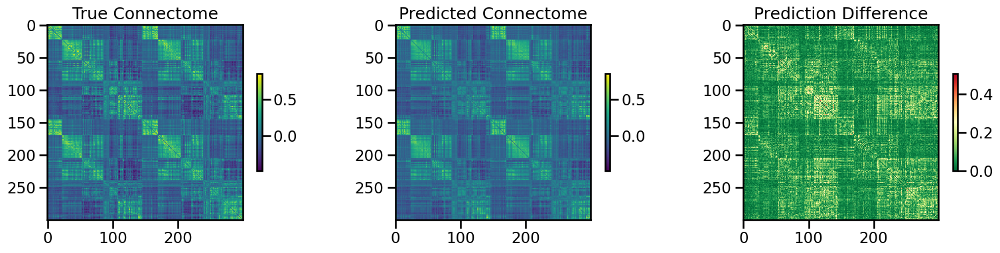

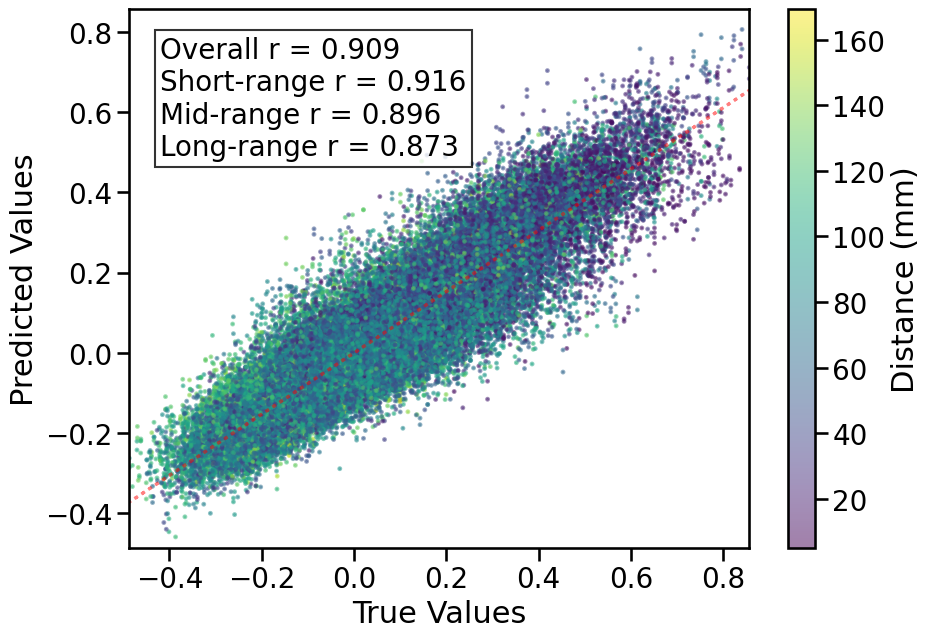

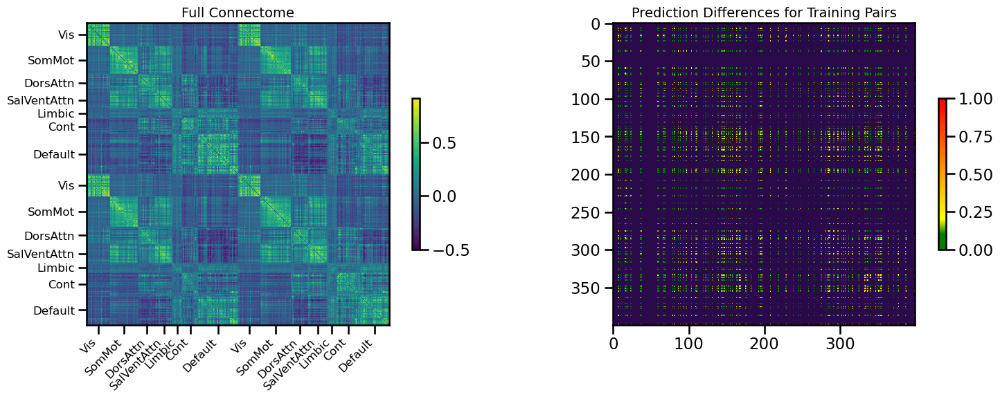

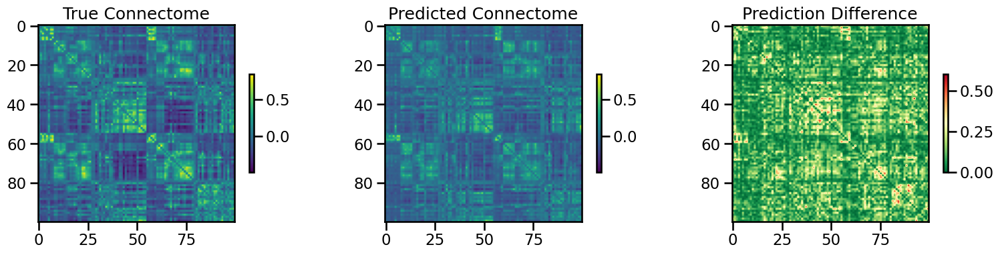

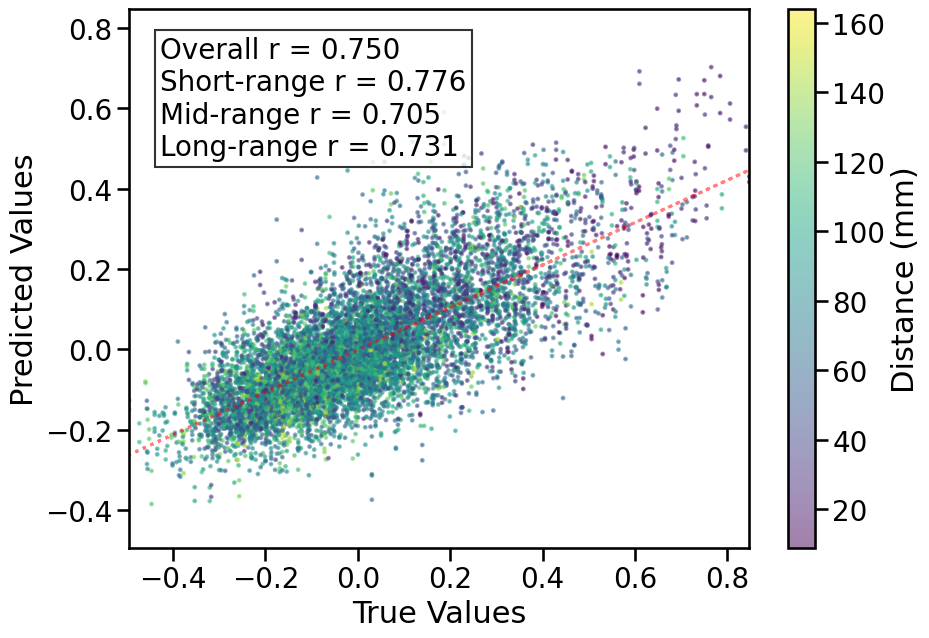


TRAIN METRICS: {'mse': 0.0070760637, 'mae': 0.06198691, 'r2': 0.8211688997793442, 'pearson_corr': 0.909297015243955, 'geodesic_distance': 18.0231802080585}
TEST METRICS: {'mse': 0.018713674, 'mae': 0.10418838, 'r2': 0.5596426285018982, 'pearson_corr': 0.750128055176914, 'geodesic_distance': 12.233676490087607}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 54, 'binarize': False, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'batch_size': 512, 'epochs': 100}


  warnings.warn(



1
2
4
BEST CONFIG {'input_dim': 54, 'binarize': False, 'hidden_dims': [256, 128], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}
Number of learnable parameters in MLP: 47873
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.02 GB
Best val loss so far at epoch 1: 0.0431
Best val loss so far at epoch 2: 0.0351
Best val loss so far at epoch 3: 0.0314
Best val loss so far at epoch 4: 0.0299
Best val loss so far at epoch 5: 0.0287
Epoch 5/100, Train Loss: 0.0488, Val Loss: 0.0287, Time: 1.01s
Best val loss so far at epoch 6: 0.0280
Best val loss so far at epoch 7: 0.0275
Best val loss so far at epoch 8: 0.0269
Best val loss so far at epoch 9: 0.0264
Best val loss so far at epoch 10: 0.0258
Epoch 10/100, Train Loss: 0.0299, Val Loss: 0.0258, Time: 1.02s
Best val loss so far at epoch 11: 0.0255
Best val loss so far at epoch 12: 0.0248
Best val loss so far at epoch 13: 0.0244
Best val loss so far at epoch 14: 0.0239
Bes

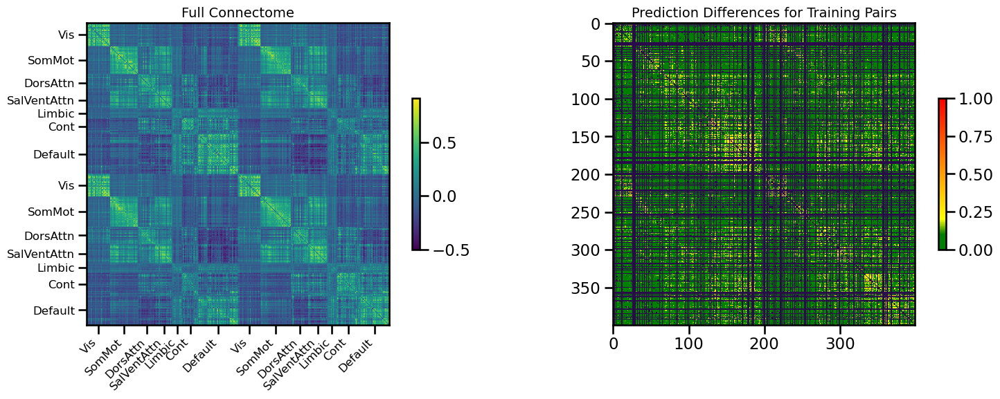

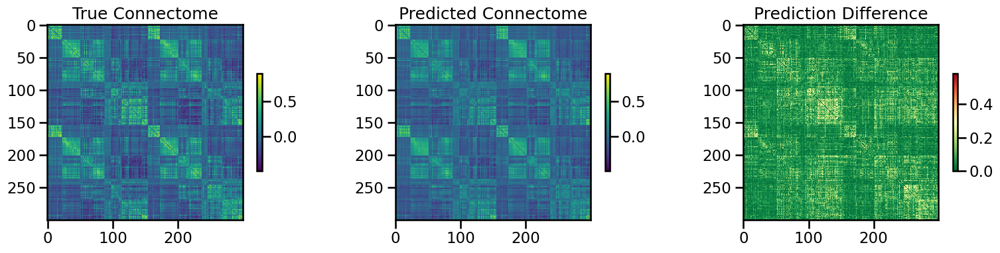

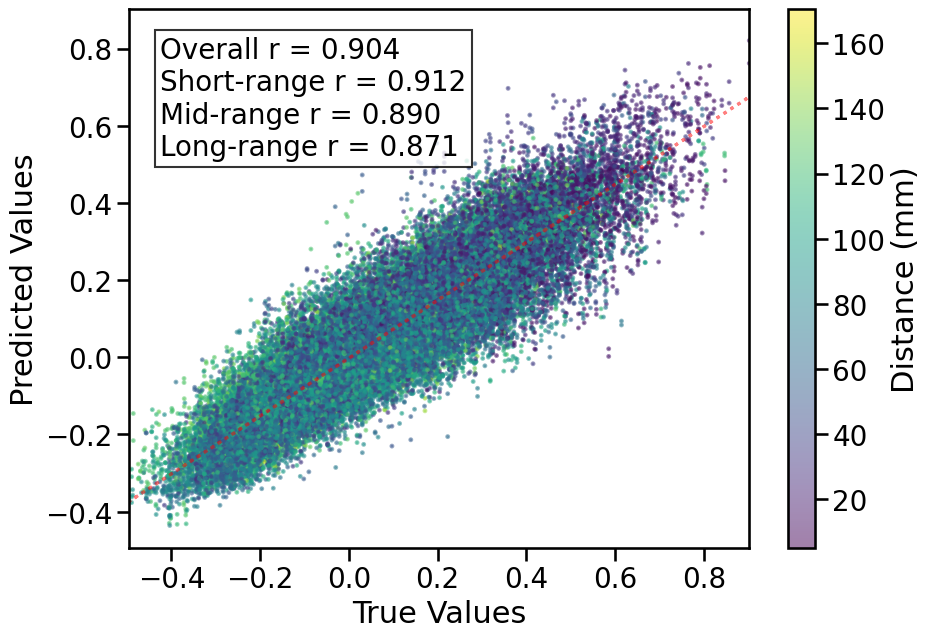

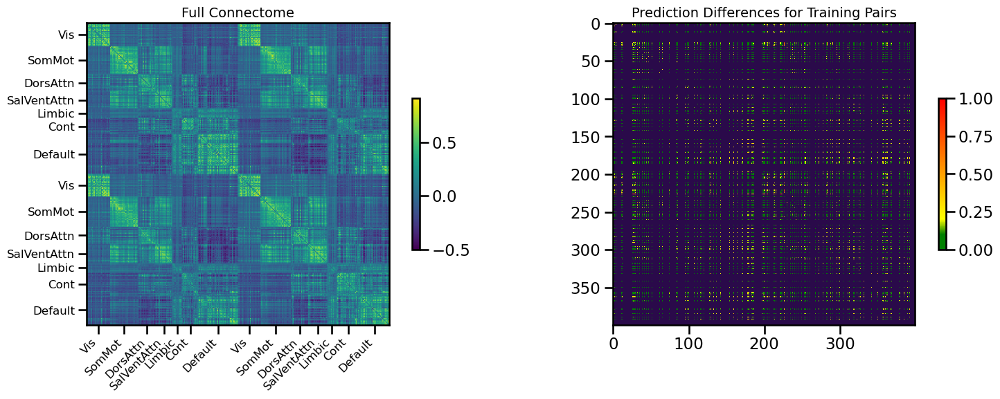

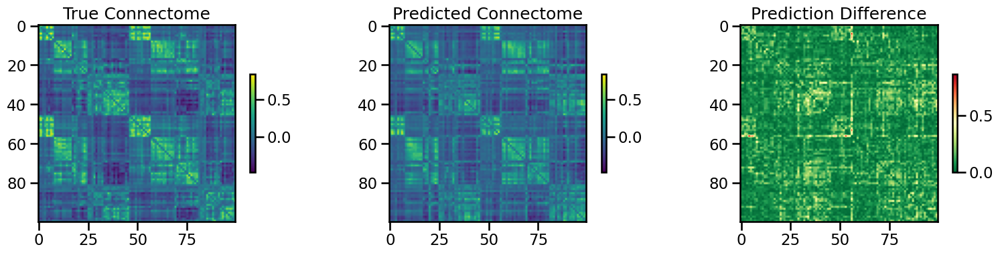

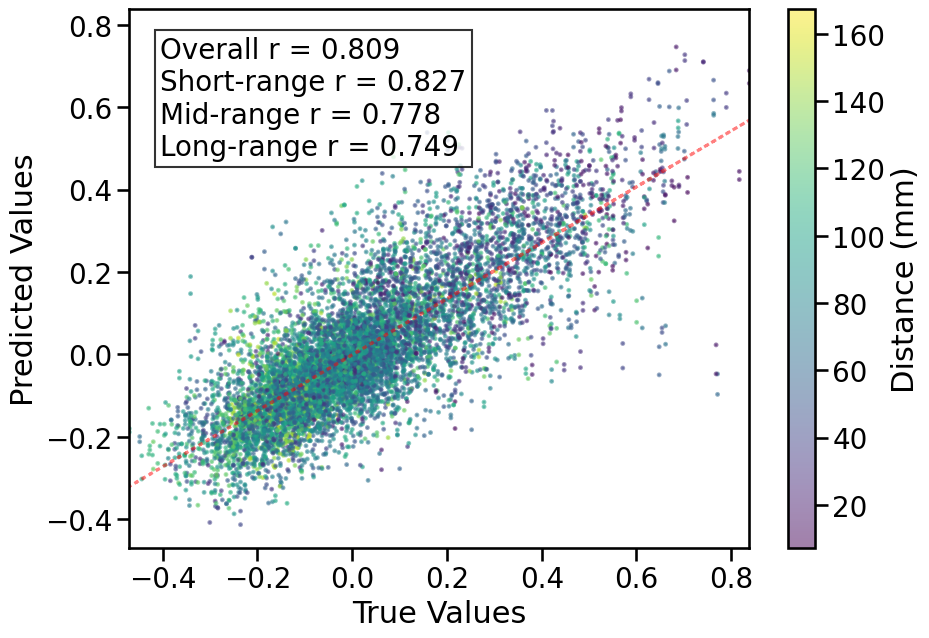


TRAIN METRICS: {'mse': 0.007593916, 'mae': 0.06475644, 'r2': 0.8099268890558392, 'pearson_corr': 0.9036564650532695, 'geodesic_distance': 19.418562013519235}
TEST METRICS: {'mse': 0.014041201, 'mae': 0.08750497, 'r2': 0.6524051128987759, 'pearson_corr': 0.8090952755208753, 'geodesic_distance': 10.171825430803581}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 54, 'binarize': False, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'batch_size': 512, 'epochs': 100}


  warnings.warn(



1
2
3
BEST CONFIG {'input_dim': 54, 'binarize': False, 'hidden_dims': [256, 128], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}
Number of learnable parameters in MLP: 47873
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.02 GB
Best val loss so far at epoch 1: 0.0440
Best val loss so far at epoch 2: 0.0351
Best val loss so far at epoch 3: 0.0311
Best val loss so far at epoch 4: 0.0292
Best val loss so far at epoch 5: 0.0278
Epoch 5/100, Train Loss: 0.0515, Val Loss: 0.0278, Time: 1.03s
Best val loss so far at epoch 6: 0.0270
Best val loss so far at epoch 7: 0.0264
Best val loss so far at epoch 8: 0.0257
Best val loss so far at epoch 9: 0.0252
Best val loss so far at epoch 10: 0.0247
Epoch 10/100, Train Loss: 0.0312, Val Loss: 0.0247, Time: 1.03s
Best val loss so far at epoch 11: 0.0243
Best val loss so far at epoch 12: 0.0241
Best val loss so far at epoch 13: 0.0235
Best val loss so far at epoch 14: 0.0234
Bes

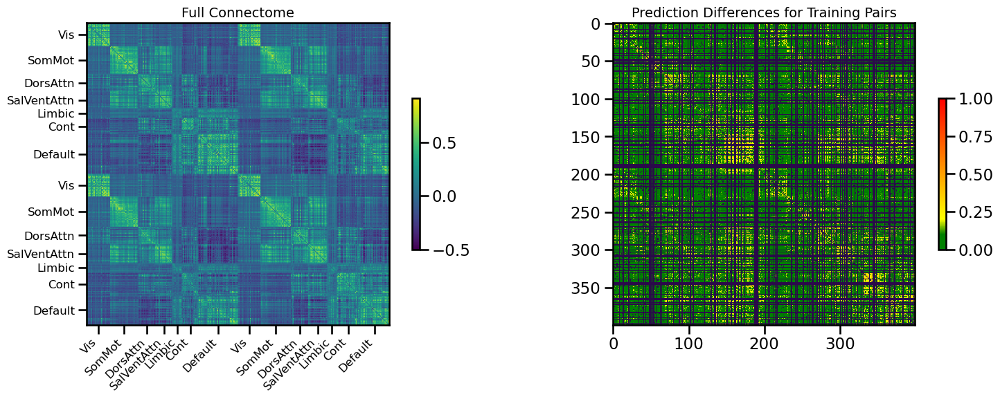

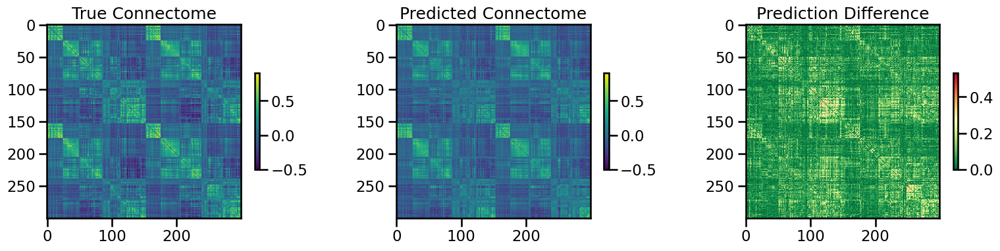

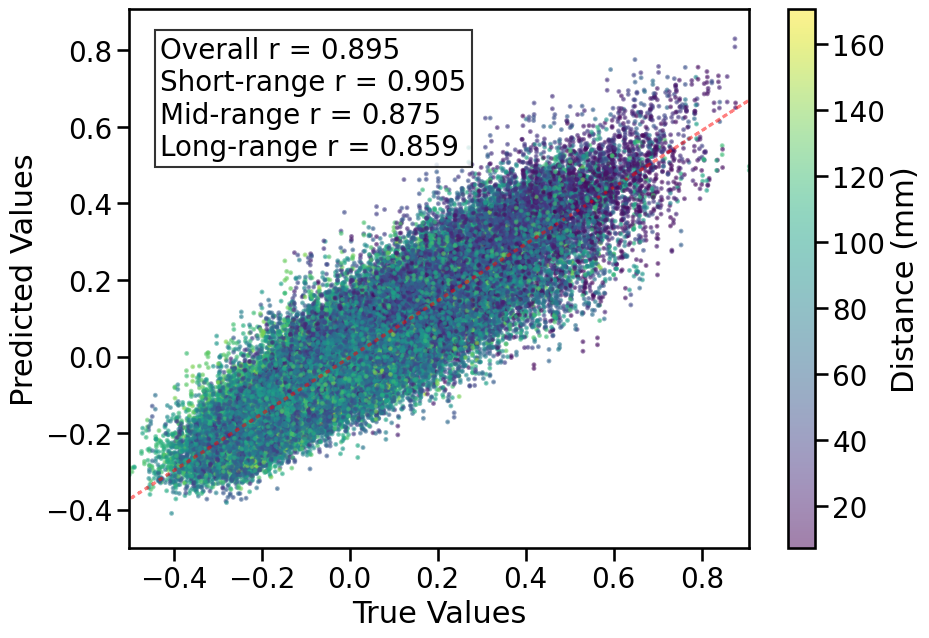

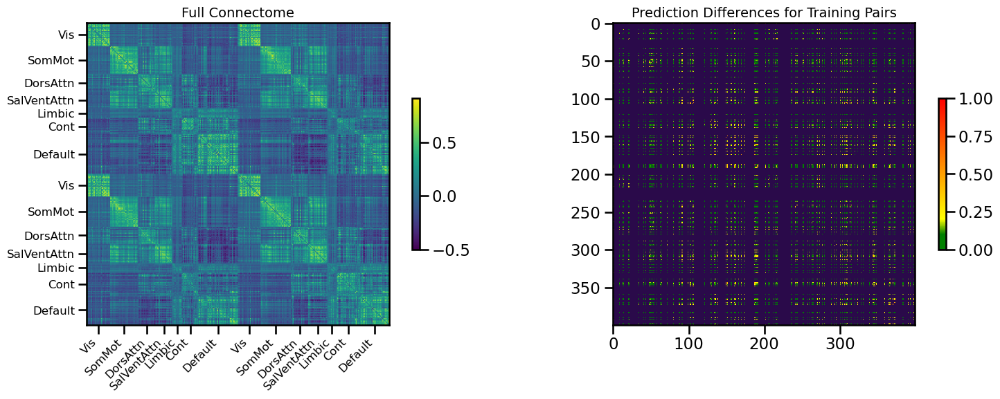

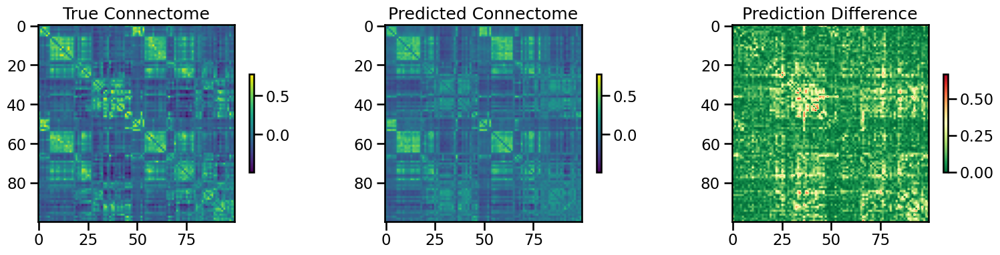

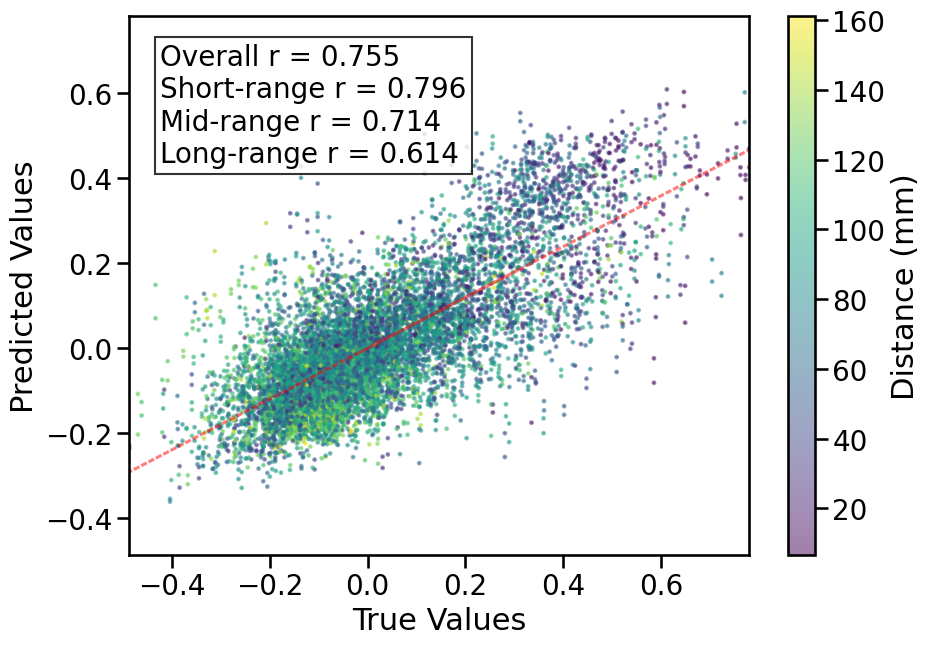


TRAIN METRICS: {'mse': 0.008437993, 'mae': 0.067992955, 'r2': 0.7946840172554474, 'pearson_corr': 0.8946479500568695, 'geodesic_distance': 18.77566512972317}
TEST METRICS: {'mse': 0.01678345, 'mae': 0.09496178, 'r2': 0.5670945307107269, 'pearson_corr': 0.7554227345747269, 'geodesic_distance': 12.3765309586145}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 54, 'binarize': False, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'batch_size': 512, 'epochs': 100}
CPU Usage: 19.7%
RAM Usage: 12.0%
Available RAM: 886.1G
Total RAM: 1007.0G
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |
Simulation completed in 464.91 seconds (7.75 minutes)


36266

In [17]:
single_sim_run(
              feature_type=[{'transcriptome_PCA': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=True,
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='expression',
              gene_list='0.2',
              cv_type='random',
              random_seed=42,
              search_method=('wandb', 'mse', 1),
              track_wandb=False,
              skip_cv=True,
              model_type='dynamic_mlp',
              use_gpu=True
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()

In [31]:
single_sim_run(
              feature_type=[{'transcriptome_PCA': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=True,
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='expression',
              gene_list='0.2',
              cv_type='random',
              random_seed=42,
              search_method=('wandb', 'mse', 1),
              track_wandb=False,
              skip_cv=True,
              model_type='dynamic_mlp',
              use_gpu=True, 
              null_model=True
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()

AttributeError: module 'netneurotools.freesurfer' has no attribute 'fetch_schaefer2018'